In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from numba import njit
import cartopy.crs as ccrs
from cartopy.io.img_tiles import OSM
import pymap3d
import scipy.constants

import gzip
import json
import pathlib

plt.rcParams['figure.figsize'] = (7, 3.5)
plt.rcParams['figure.facecolor'] = 'w'

In [2]:
lon_rx = -3.69318
lat_rx = 40.620582
h_rx = 781.0

# AIP ENR 4.1 WEF 11-JUL-24
# 403845.5N
# 0034409.0W
# (810)
lat_dme = 40 + 38/60 + 45.5/3600
lon_dme = -(3 + 44/60 + 09.0/3600)
h_dme = 810

lat_vtb = 39 + 46/60 + 50.7/3600
lon_vtb = -(3 + 27/60 + 50.5/3600)
lat_sie = 41 + 9/60 + 6.1/3600
lon_sie = -(3 + 36/60 + 16.8/3600)
lat_arlun = 42 + 1/60 + 18/3600
lon_arlun = -(3 + 36/60 + 49/3600)
lat_n865 = [lat_vtb, lat_sie, lat_arlun]
lon_n865 = [lon_vtb, lon_sie, lon_arlun]
lat_ssy = 40 + 32/60 + 47.1/3600
lon_ssy = -(3 + 34/60 + 31.3/3600)
lat_bra = 40 + 28/60 + 8.9/3600
lon_bra = -(3 + 33/60 + 27.1/3600)
lat_md012 = 40 + 39/60 + 47.1/3600
lon_md012 = -(3 + 42/60 + 13.9/3600)
lat_md041 = 40 + 36/60 + 27.7/3600
lon_md041 = -(3 + 47/60 + 58.2/3600)
lat_vtb6l = [lat_ssy, lat_md012, lat_md041, lat_bra]
lon_vtb6l = [lon_ssy, lon_md012, lon_md041, lon_bra]
lat_md039 = 40 + 38/60 + 25.6/3600
lon_md039 = -(3 + 40/60 + 43.6/3600)
lat_avila = 40 + 37/60 + 28.6/3600
lon_avila = -(4 + 32/60 + 59.6/3600)
lat_bardi7l = [lat_ssy, lat_md039, lat_avila]
lon_bardi7l = [lon_ssy, lon_md039, lon_avila]
lat_md044 = 40 + 46/60 + 49.4/3600
lon_md044 = -(3 + 39/60 + 31.0/3600)
lat_disko = 41 + 0/60 + 54.9/3600
lon_disko = -(4 + 13/60 + 23.7/3600)
lat_zmr = 41 + 31/60 + 48.2/3600
lon_zmr = -(5 + 38/60 + 23.1/3600)
lat_zmr7l = [lat_ssy, lat_md039, lat_md044, lat_disko, lat_zmr]
lon_zmr7l = [lon_ssy, lon_md039, lon_md044, lon_disko, lon_zmr]
lat_uredi = 39 + 51.59/60
lon_uredi = -(6 + 23.60/60)
lat_dipol = 40 + 24.99/60
lon_dipol = -(4 + 40.58/60)
lat_rbo = 40 + 51/60 + 14.3/3600
lon_rbo = -(3 + 14/60 + 47.4/3600)
lat_pinar = 40 + 58/60 + 49.1/3600
lon_pinar = -(2 + 35/60 + 57.0/3600)
lat_n870 = [lat_uredi, lat_dipol, lat_rbo, lat_pinar]
lon_n870 = [lon_uredi, lon_dipol, lon_rbo, lon_pinar]
lat_rilko = 40 + 58/60 + 44.1/3600
lon_rilko = -(3 + 47/60 + 48.6/3600)
lat_md711 = 40 + 51/60 + 9.8/3600
lon_md711 = -(3 + 36/60 + 45.5/3600)
lat_ibope = 40 + 48/60 + 20.1/3600
lon_ibope = -(3 + 34/60 + 35.1/3600)
lat_ils18r = [lat_rilko, lat_md711, lat_ibope, lat_ssy]
lon_ils18r = [lon_rilko, lon_md711, lon_ibope, lon_ssy]
lat_tld = 39.969501
lon_tld = -4.337470
lat_dgo = 42.453300
lon_dgo = -2.880710
lat_n858 = [lat_tld, lat_sie, lat_dgo]
lon_n858 = [lon_tld, lon_sie, lon_dgo]

In [3]:
jsons = pathlib.Path('adsb').glob('*.json')
aircrafts = {}
for fz in jsons:
    with gzip.open(fz) as f:
        aircraft = json.loads(f.read())
        aircrafts[aircraft['icao']] = aircraft

In [4]:
recordings_path = 'recordings'
samp_rate = 2.5e6
recording_t0 = np.datetime64('2024-07-13T08:23:52')
ground_t_raw = np.fromfile('CNR_VOR_ground_2024-07-13_offsets.f64', 'float64') / samp_rate
ground_t = recording_t0 + (ground_t_raw * 1e9) * np.timedelta64(1, 'ns')
ground_mf = np.fromfile('CNR_VOR_ground_2024-07-13_mf.c64', 'complex64')
aircraft_t_raw = np.fromfile('CNR_VOR_aircraft_2024-07-13_offsets.f64', 'float64') / samp_rate
aircraft_t = recording_t0 + (aircraft_t_raw * 1e9) * np.timedelta64(1, 'ns')
aircraft_mf = np.fromfile('CNR_VOR_aircraft_2024-07-13_mf.c64', 'complex64')

In [5]:
ground_t.size, aircraft_t.size

(6287903, 1075427)

In [6]:
recording_duration = 7298.8055852
np.array([ground_t.size, aircraft_t.size]) / recording_duration

array([861.49753225, 147.34287514])

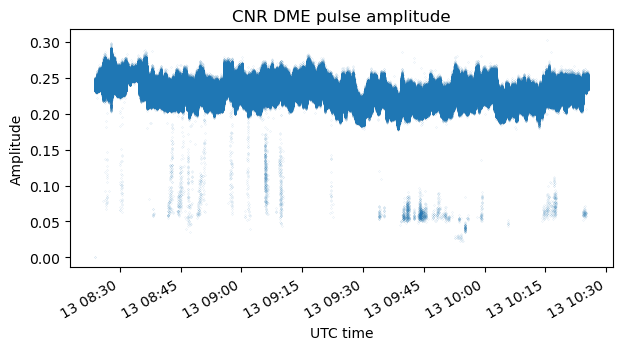

In [7]:
plt.plot(ground_t, np.abs(ground_mf), '.', markersize=0.1)
plt.gcf().autofmt_xdate()
plt.xlabel('UTC time')
plt.ylabel('Amplitude')
plt.title('CNR DME pulse amplitude');

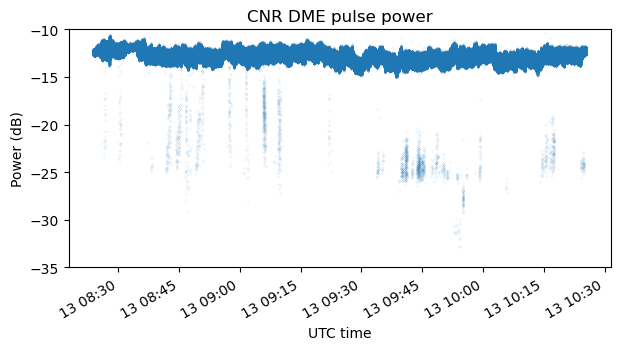

In [8]:
plt.plot(ground_t, 20*np.log10(np.abs(ground_mf)), '.', markersize=0.1)
plt.gcf().autofmt_xdate()
plt.ylim(-35, -10)
plt.xlabel('UTC time')
plt.ylabel('Power (dB)')
plt.title('CNR DME pulse power');

In [9]:
def get_samples(t, signal='ground', span=50e-6):
    processing_delay = 13 + 26 + 31 + 90
    span = round(span * samp_rate)
    t = (t - recording_t0) / np.timedelta64(1, 's')
    a = round(t * samp_rate) - processing_delay
    x = np.fromfile(f'{recordings_path}/CNR_VOR_{signal}_2024-07-13.sigmf-data', 'int16', offset=4*(a-span), count=4*span)
    return x.astype('float32').view('complex64') / 2**15

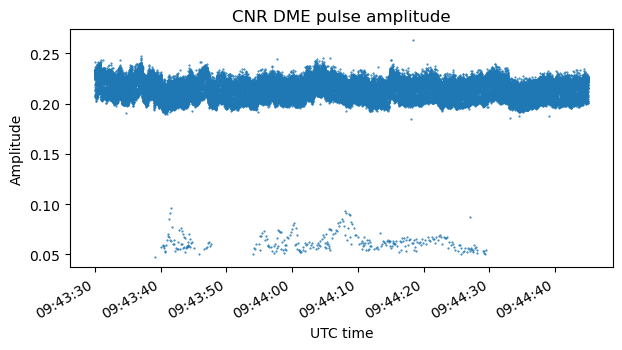

In [10]:
sel = (ground_t >= np.datetime64('2024-07-13T09:43:30')) & (ground_t <= np.datetime64('2024-07-13T09:44:45'))
plt.plot(ground_t[sel], np.abs(ground_mf[sel]), '.', markersize=1)
plt.gcf().autofmt_xdate()
plt.xlabel('UTC time')
plt.ylabel('Amplitude')
plt.title('CNR DME pulse amplitude');

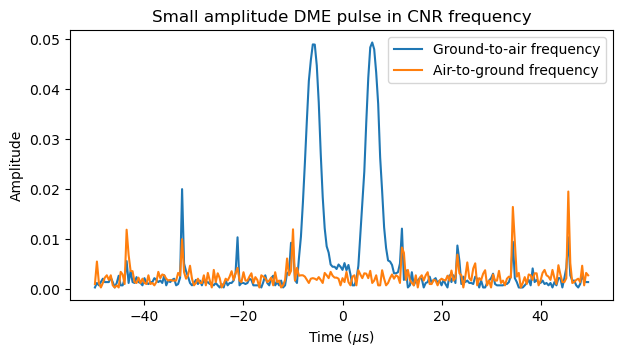

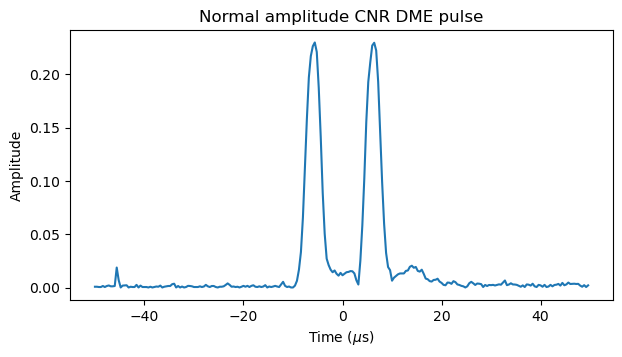

In [11]:
small_pulse = np.where(np.abs(ground_mf[sel]) < 0.05)[0][0]
taxis = np.arange(-round(50e-6 * samp_rate), round(50e-6 * samp_rate)) / samp_rate * 1e6
plt.plot(taxis, np.abs(get_samples(ground_t[sel][small_pulse])))
plt.plot(taxis, np.abs(get_samples(ground_t[sel][small_pulse], signal='aircraft')))
plt.legend(['Ground-to-air frequency', 'Air-to-ground frequency'])
plt.title('Small amplitude DME pulse in CNR frequency')
plt.xlabel('Time ($\\mu$s)')
plt.ylabel('Amplitude')
plt.figure()
plt.plot(taxis, np.abs(get_samples(ground_t[sel][small_pulse-1])))
plt.title('Normal amplitude CNR DME pulse')
plt.xlabel('Time ($\\mu$s)')
plt.ylabel('Amplitude');

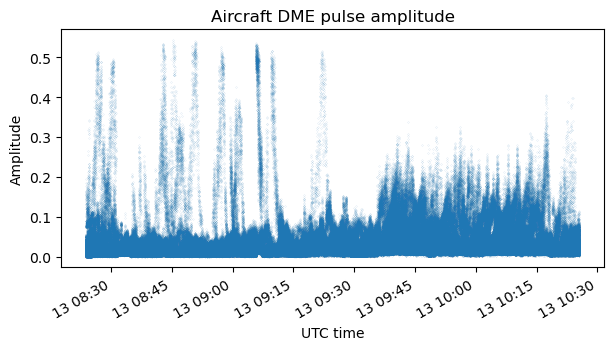

In [12]:
plt.plot(aircraft_t, np.abs(aircraft_mf), '.', markersize=0.1)
plt.gcf().autofmt_xdate()
plt.xlabel('UTC time')
plt.ylabel('Amplitude')
plt.title('Aircraft DME pulse amplitude');

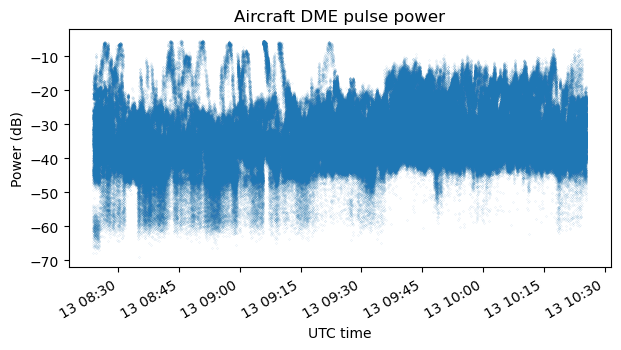

In [13]:
plt.plot(aircraft_t, 20*np.log10(np.abs(aircraft_mf)), '.', markersize=0.1)
plt.gcf().autofmt_xdate()
plt.xlabel('UTC time')
plt.ylabel('Power (dB)')
plt.title('Aircraft DME pulse power');

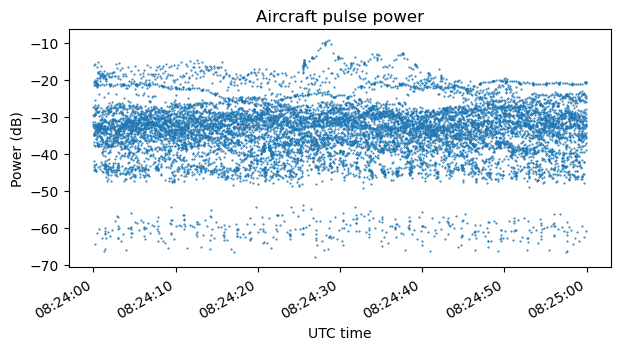

In [14]:
sel = (aircraft_t >= np.datetime64('2024-07-13T08:24:00')) & (aircraft_t <= np.datetime64('2024-07-13T08:25:00'))
plt.plot(aircraft_t[sel], 20*np.log10(np.abs(aircraft_mf[sel])), '.', markersize=1)
plt.gcf().autofmt_xdate()
plt.xlabel('UTC time')
plt.ylabel('Power (dB)')
plt.title('Aircraft pulse power');

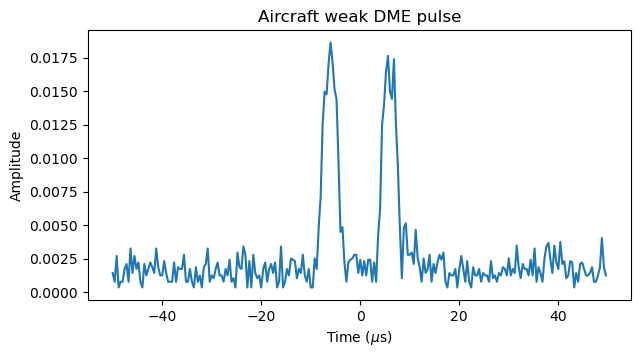

In [15]:
weak_pulse = np.where(20*np.log10(np.abs(aircraft_mf[sel])) < -60)[0][0]
taxis = np.arange(-round(50e-6 * samp_rate), round(50e-6 * samp_rate)) / samp_rate * 1e6
plt.plot(taxis, np.abs(get_samples(aircraft_t[sel][small_pulse], signal='aircraft')))
plt.title('Aircraft weak DME pulse')
plt.xlabel('Time ($\\mu$s)')
plt.ylabel('Amplitude');

In [16]:
@njit
def compute_hits(air_ts, ground_ts):
    maxhits = 3
    min_delay = 45e-6
    max_delay = 85e-6
    delays = np.full((air_ts.size, maxhits), np.nan)
    idx_a = 0
    idx_b = 0
    for j, t_air in enumerate(air_ts):
        while ground_ts[idx_a] - t_air < min_delay:
            idx_a += 1
            if idx_a == ground_ts.size:
                break
        idx_b = max(idx_a, idx_b)
        while ground_ts[idx_b] - t_air <= max_delay:
            idx_b += 1
            if idx_b == ground_ts.size:
                break
        dels = ground_ts[idx_a:idx_b] - t_air
        dels = dels[:maxhits]
        delays[j, :dels.size] = dels
    return delays

In [17]:
delays = compute_hits(aircraft_t_raw, ground_t_raw)
np.histogram(np.sum(~np.isnan(delays), axis=1), bins=range(delays.shape[1]+2))[0]

array([140073, 935351,      3,      0])

In [18]:
np.histogram(np.sum(~np.isnan(delays), axis=1), bins=range(delays.shape[1]+2))[0] / aircraft_mf.size

array([1.30248729e-01, 8.69748481e-01, 2.78958962e-06, 0.00000000e+00])

In [19]:
def plot_delays(adsb_traces=False):
    num_plots = 7
    fig, axs = plt.subplots(num_plots, 1, figsize=(7, 3.5 * num_plots), sharey=True)
    seconds_per_plot = aircraft_t_raw[-1] / num_plots
    for j in range(num_plots):
        sel = (aircraft_t_raw >= j * seconds_per_plot) & (aircraft_t_raw < (j + 1) * seconds_per_plot)
        for k in range(delays.shape[1]):
            axs[j].scatter(aircraft_t[sel], 1e6*delays[sel, k], s=0.1,
                           c=20*np.log10(np.abs(aircraft_mf[sel])), vmin=-50, vmax=-15, marker='.')
        axs[j].margins(x=0, y=0)
        axs[j].set_ylabel('Delay ($\\mu$s)')
        if adsb_traces:
            for icao in aircrafts:
                t, d = aircraft_delays[icao]
                t_raw = (t - recording_t0) / np.timedelta64(1, 's')      
                sel = (t_raw >= j * seconds_per_plot) & (t_raw < (j + 1) * seconds_per_plot)
                sel = sel & (aircraft_elevations[icao] >= 1)
                dt = np.diff(t_raw)
                if dt.size:
                    d[np.concatenate(([False], dt > 100))] = np.nan
                axs[j].plot(t[sel], d[sel] * 1e6, color='red', linewidth=0.25)
    axs[-1].set_xlabel('UTC time')
    plt.subplots_adjust(hspace=0.15)
    adsb_title = ', ADS-B traces in red' if adsb_traces else ''
    plt.suptitle(f'Delay between groundstation and aircraft pulses\n(coloured by aircraft pulse power{adsb_title})',
                 y=0.895);

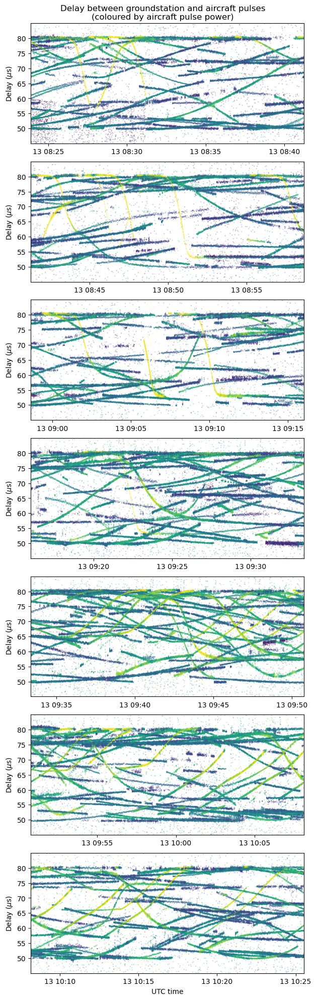

In [20]:
plot_delays()

In [21]:
tdoa_bias = 50e-6 + pymap3d.geodetic2aer(lat_dme, lon_dme, h_dme, lat_rx, lon_rx, h_rx)[2] / scipy.constants.c

def aircraft_time(aircraft):
    return np.array([(aircraft['timestamp'] + tr[0]) * 1e9 * np.timedelta64(1, 'ns') + np.datetime64('1970-01-01')
                     for tr in aircraft['trace']])

def aircraft_lat(aircraft):
    return np.array([tr[1] for tr in aircraft['trace']])

def aircraft_lon(aircraft):
    return np.array([tr[2] for tr in aircraft['trace']])

def aircraft_height(aircraft):
    return np.array([np.nan if tr[3] == 'ground' or tr[3] is None
                     else tr[3] * scipy.constants.foot for tr in aircraft['trace']])

def aircraft_delay(aircraft,
                   tstart=np.datetime64('2024-07-13T08:23:52'),
                   tstop=np.datetime64('2024-07-13T10:25:31')):
    t = aircraft_time(aircraft)
    tsel = (t >= tstart) & (t <= tstop)
    t = t[tsel]
    lat = aircraft_lat(aircraft)[tsel]
    lon = aircraft_lon(aircraft)[tsel]
    h = aircraft_height(aircraft)[tsel]
    tdoa = (pymap3d.geodetic2aer(lat, lon, h, lat_dme, lon_dme, h_dme)[2]
            - pymap3d.geodetic2aer(lat, lon, h, lat_rx, lon_rx, h_rx)[2]) / scipy.constants.c
    delay = tdoa + tdoa_bias
    return t, delay

In [22]:
aircraft_delays = {icao: aircraft_delay(aircraft) for icao, aircraft in aircrafts.items()}

In [23]:
def aircraft_distance_rx(aircraft,
                         tstart=np.datetime64('2024-07-13T08:23:52'),
                         tstop=np.datetime64('2024-07-13T10:25:31')):
    t = aircraft_time(aircraft)
    tsel = (t >= tstart) & (t <= tstop)
    t = t[tsel]
    lat = aircraft_lat(aircraft)[tsel]
    lon = aircraft_lon(aircraft)[tsel]
    h = aircraft_height(aircraft)[tsel]
    return pymap3d.geodetic2aer(lat, lon, h, lat_rx, lon_rx, h_rx)[2]

def aircraft_elevation_rx(aircraft,
                         tstart=np.datetime64('2024-07-13T08:23:52'),
                         tstop=np.datetime64('2024-07-13T10:25:31')):
    t = aircraft_time(aircraft)
    tsel = (t >= tstart) & (t <= tstop)
    t = t[tsel]
    lat = aircraft_lat(aircraft)[tsel]
    lon = aircraft_lon(aircraft)[tsel]
    h = aircraft_height(aircraft)[tsel]
    return pymap3d.geodetic2aer(lat, lon, h, lat_rx, lon_rx, h_rx)[1]

aircraft_elevations = {icao: aircraft_elevation_rx(aircraft) for icao, aircraft in aircrafts.items()}

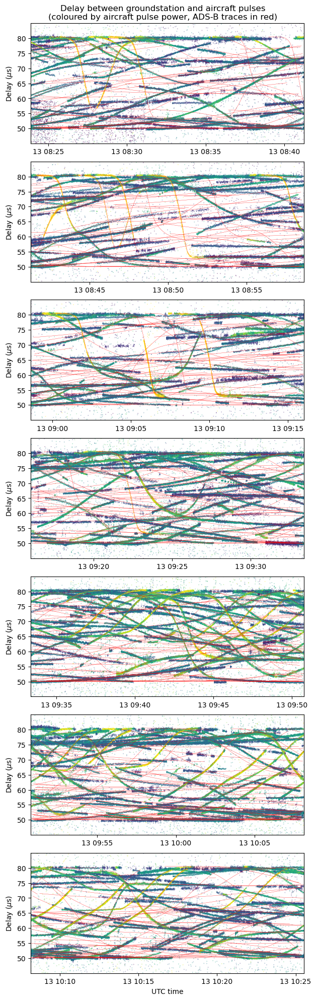

In [24]:
plot_delays(adsb_traces=True)

In [25]:
def extra_info(icao):
    extra = ''
    try:
        extra = f' ({aircrafts[icao]["r"]}'
    except KeyError:
        pass
    else:
        tstart=np.datetime64('2024-07-13T08:23:52')
        tstop=np.datetime64('2024-07-13T10:25:31')
        ts = aircraft_time(aircrafts[icao])
        for t, tr in zip(ts, aircrafts[icao]['trace']):
            if t < tstart or t > tstop:
                continue
            if tr[8] is None:
                continue
            try:
                flight = tr[8]['flight'].strip()
            except KeyError:
                pass
            else:
                extra += f', {flight})'
                break
        else:
            extra += ')'
    return extra

def plot_aircraft(icao, tslice, tolerance = 1.5e-6, markersize=0.1):
    tdelta = np.timedelta64(60, 's')

    tsel = (aircraft_t >= tslice[0]) & (aircraft_t <= tslice[1])
    air_t, air_delay = aircraft_delays[icao]

    fig, axs = plt.subplots(2, 1, figsize=(7, 7), sharex=True)
    axs[0].scatter(aircraft_t[tsel], 1e6*delays[tsel, 0], s=markersize,
                   c=20*np.log10(np.abs(aircraft_mf[tsel])),
                   vmin=-50, vmax=-15, marker='.')
    axs[0].plot(air_t, 1e6*air_delay, color='red', linewidth=1, alpha=0.5)
    axs[0].set_ylim(45, 85)
    axs[0].set_xlim(tslice)
    axs[0].set_ylabel('Delay ($\\mu$s)')

    air_interp = np.interp(aircraft_t_raw, (air_t - recording_t0) / np.timedelta64(1, 's'),
                           air_delay, left=np.nan, right=np.nan)
    close_sel = (np.abs(air_interp - delays[:,0]) < tolerance) & tsel

    axs[1].scatter(aircraft_t[close_sel], 1e6 * (delays[close_sel, 0] - air_interp[close_sel]), s=markersize,
                   c=20*np.log10(np.abs(aircraft_mf[close_sel])),
                   vmin=-50, vmax=-15, marker='.')
    axs[1].set_xlim(tslice)
    mn, mx = plt.gca().get_ylim()
    axs[1].set_ylabel('Delay error ($\\mu$s)')
    axs[1].set_xlabel('UTC time')
    ax2 = plt.twinx()
    ax2.set_ylabel('Delay error (m)')
    ax2.set_ylim(mn * scipy.constants.c * 1e-6, mx * scipy.constants.c * 1e-6)

    plt.subplots_adjust(hspace=0)
    extra = ''
    try:
        extra = f' ({aircrafts[icao]["r"]}'
    except KeyError:
        pass
    else:
        for t in aircrafts[icao]['trace']:
            if t[8] is None:
                continue
            try:
                flight = t[8]['flight'].strip()
            except KeyError:
                pass
            else:
                extra += f', {flight})'
                break
        else:
            extra += ')'
    plt.suptitle(f'Delay and delay error for ICAO 0x{icao} {extra_info(icao)}', y=0.91)

imagery = OSM()

def plot_map(icao, tslice, latlon_route=None, extent=[-5.5, -1, 39, 42.5], level=8):
    plt.figure(figsize=(8, 8))
    ax = plt.axes(projection=imagery.crs)
    ax.set_extent(extent)
    ax.add_image(imagery, level)
    aircraft = aircrafts[icao]
    t = np.array([(aircraft['timestamp'] + tr[0]) * 1e9 * np.timedelta64(1, 'ns') + np.datetime64('1970-01-01')
                  for tr in aircraft['trace']])
    tsel = (t >= tslice[0]) & (t <= tslice[1])
    lat = np.array([tr[1] for tr in aircraft['trace']])[tsel]
    lon = np.array([tr[2] for tr in aircraft['trace']])[tsel]
    if latlon_route is not None:
        plt.plot(latlon_route[1], latlon_route[0], '.-', transform=ccrs.Geodetic(), color='grey')
    plt.plot(lon, lat, '-', transform=ccrs.Geodetic(), color='red')
    plt.plot(lon[-1], lat[-1], 'o', transform=ccrs.Geodetic(), color='red')
    plt.plot(lon_rx, lat_rx, 'o', transform=ccrs.Geodetic(), color='black', markersize=3)
    plt.plot(lon_dme, lat_dme, 'o', transform=ccrs.Geodetic(), color='black', markersize=3)
    plt.title(f'Trajectory for ICAO 0x{icao} {extra_info(icao)}')

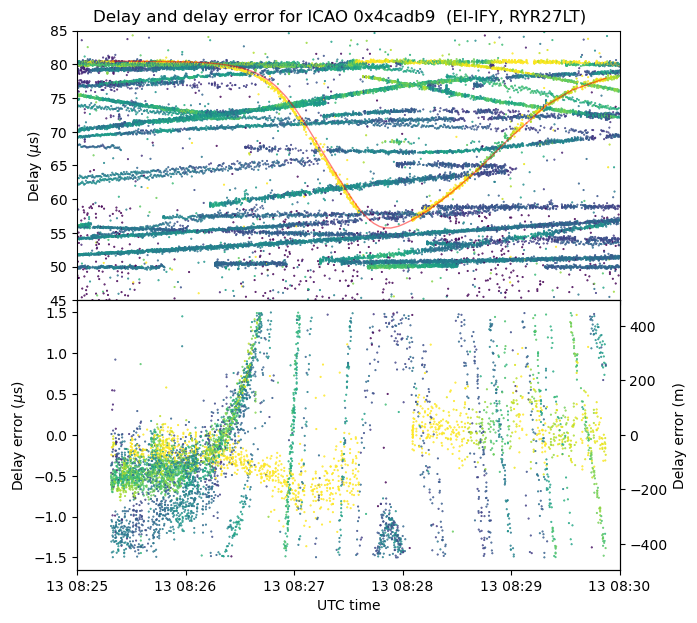

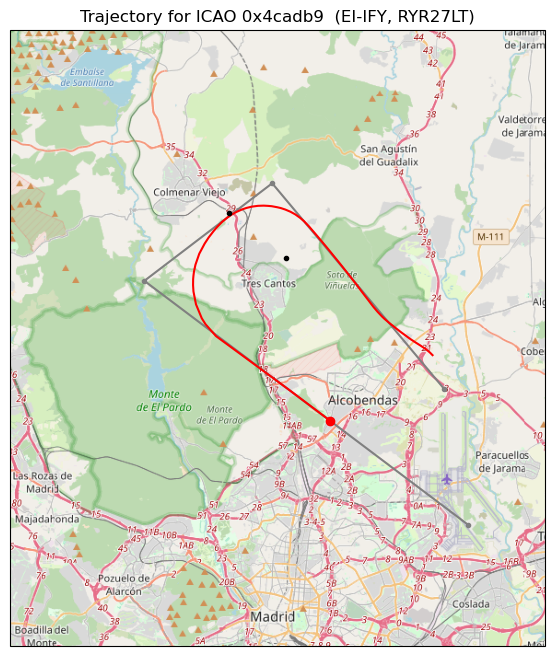

In [26]:
plot_aircraft('4cadb9', (np.datetime64('2024-07-13T08:25:00'), np.datetime64('2024-07-13T08:30:00')), markersize=1)
plot_map('4cadb9', (np.datetime64('2024-07-13T08:25:00'), np.datetime64('2024-07-13T08:30:00')),
         (lat_vtb6l, lon_vtb6l), extent=[-3.9, -3.5, 40.4, 40.75], level=11)

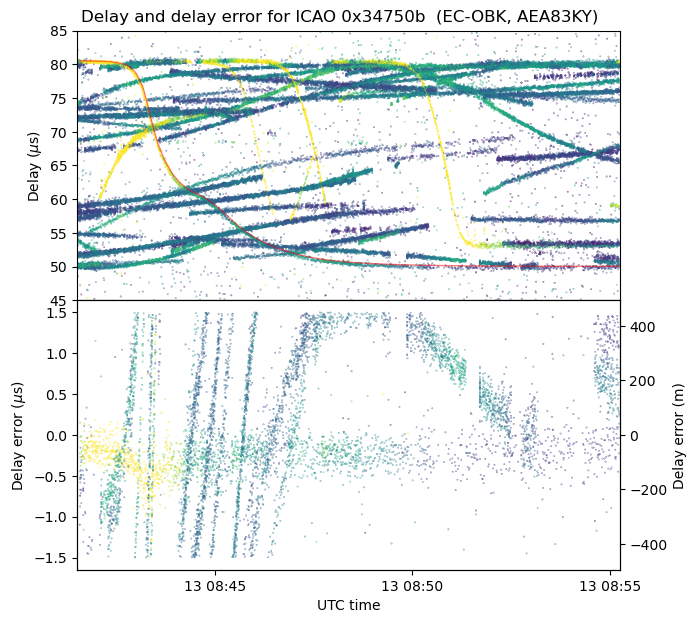

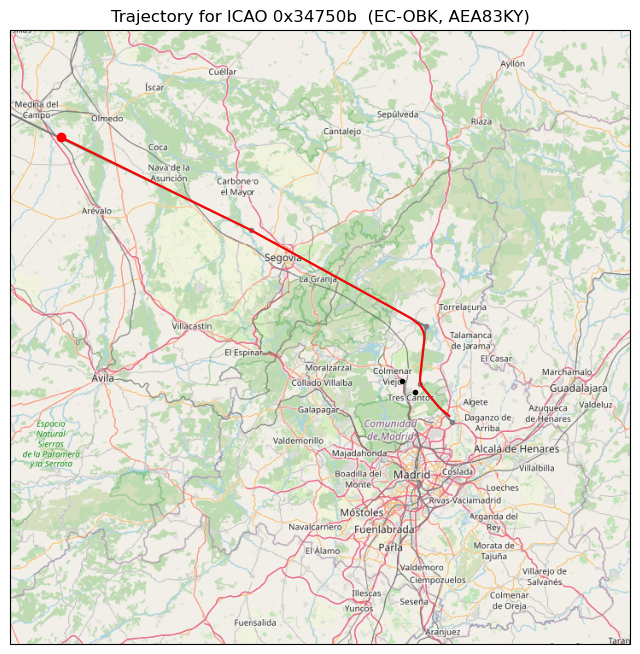

In [27]:
plot_aircraft('34750b', (np.datetime64('2024-07-13T08:41:30'), np.datetime64('2024-07-13T08:55:15')), markersize=0.2)
plot_map('34750b', (np.datetime64('2024-07-13T08:41:30'), np.datetime64('2024-07-13T08:55:15')),
         (lat_zmr7l, lon_zmr7l), extent=[-5, -3, 40, 41.5], level=9)

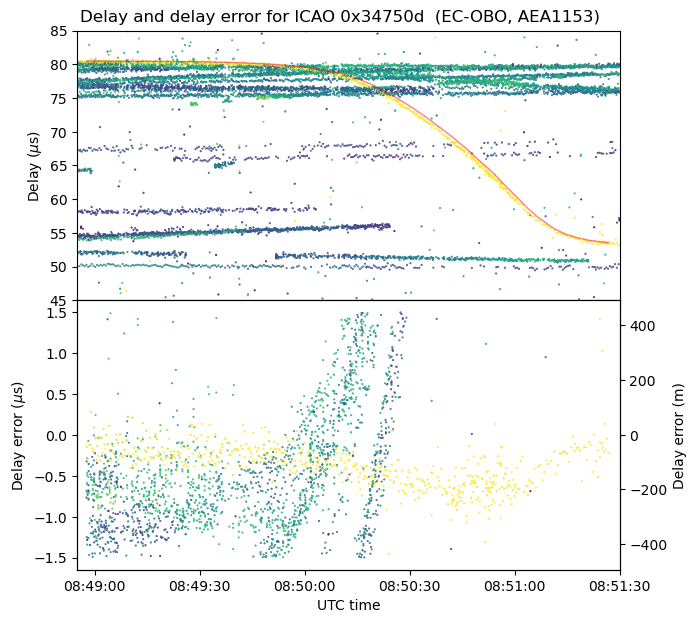

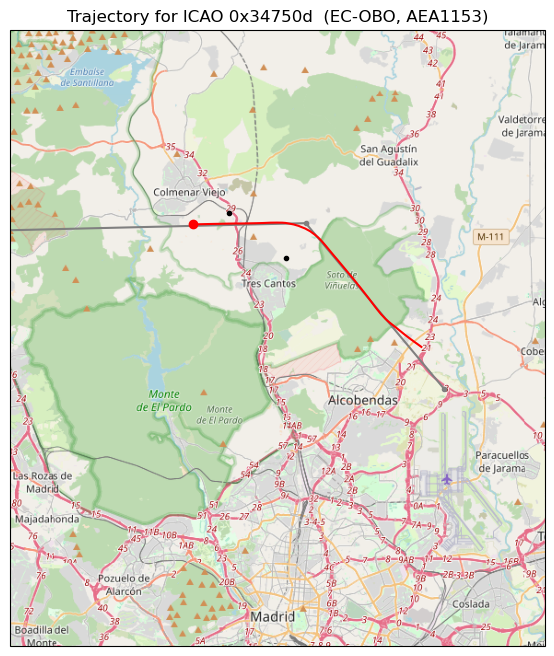

In [28]:
plot_aircraft('34750d', (np.datetime64('2024-07-13T08:48:55'), np.datetime64('2024-07-13T08:51:30')), markersize=1)
plot_map('34750d', (np.datetime64('2024-07-13T08:48:55'), np.datetime64('2024-07-13T08:51:30')),
         (lat_bardi7l, lon_bardi7l), extent=[-3.9, -3.5, 40.4, 40.75], level=11)

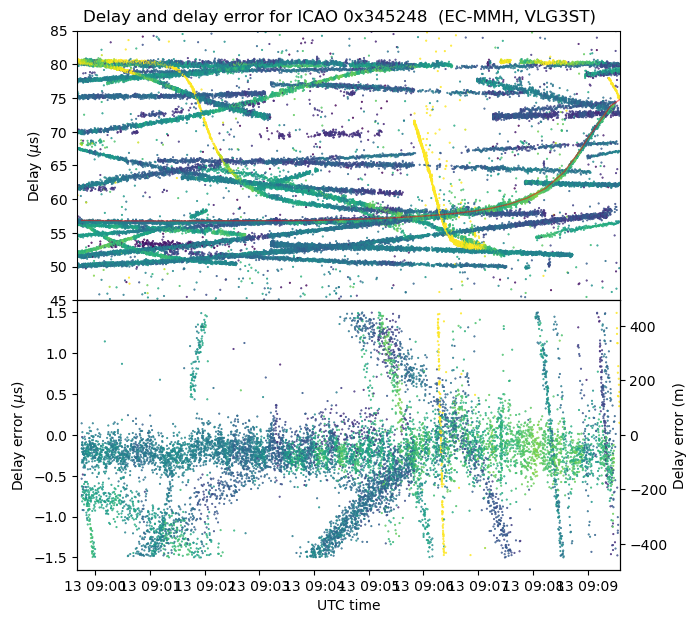

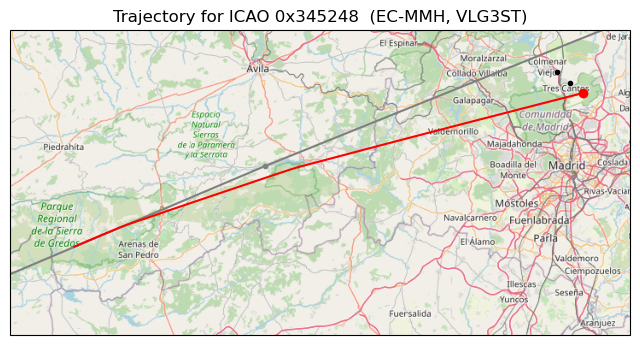

In [29]:
plot_aircraft('345248', (np.datetime64('2024-07-13T08:59:40'), np.datetime64('2024-07-13T09:09:35')), markersize=1)
plot_map('345248', (np.datetime64('2024-07-13T08:59:40'), np.datetime64('2024-07-13T09:09:35')), (lat_n870, lon_n870),
         extent=[-5.5, -3.5, 40, 40.75], level=9)

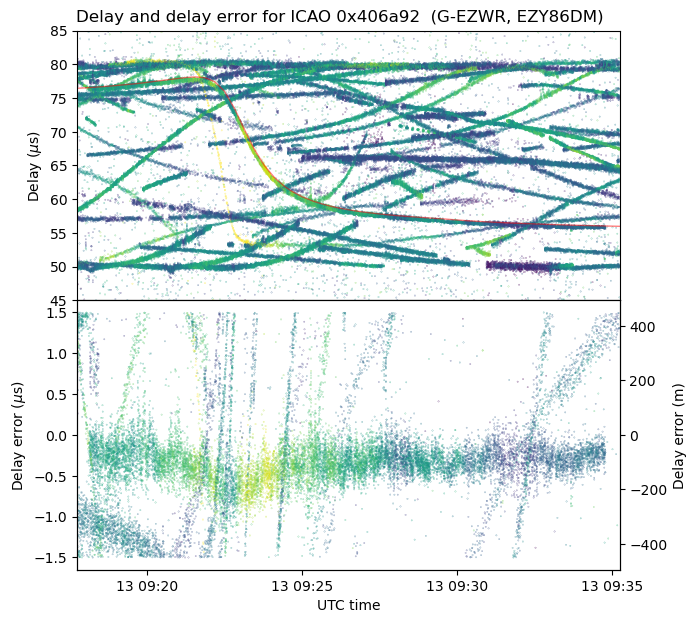

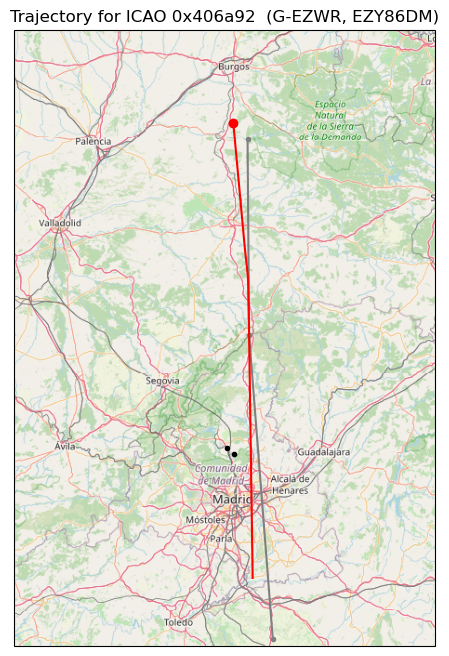

In [30]:
plot_aircraft('406a92', (np.datetime64('2024-07-13T09:17:45'), np.datetime64('2024-07-13T09:35:15')))
plot_map('406a92', (np.datetime64('2024-07-13T09:17:45'), np.datetime64('2024-07-13T09:35:15')), (lat_n865, lon_n865),
         extent=[-5, -2.5, 39.75, 42.5])

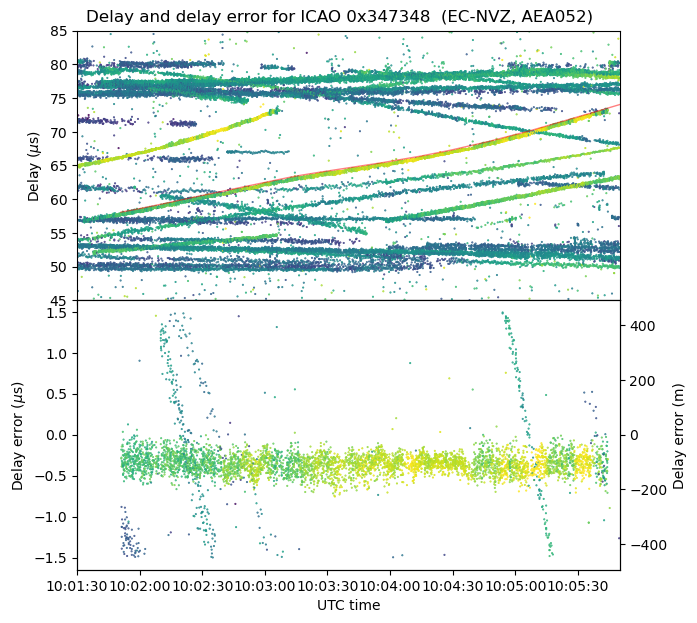

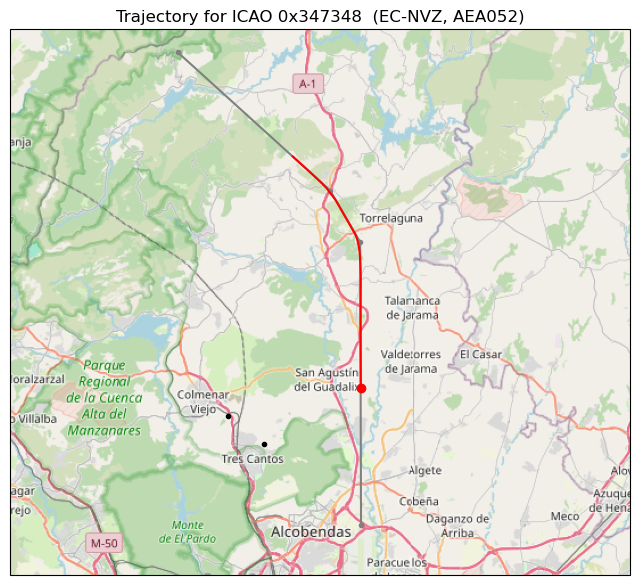

In [31]:
plot_aircraft('347348', (np.datetime64('2024-07-13T10:01:30'), np.datetime64('2024-07-13T10:05:50')), markersize=1)
plot_map('347348', (np.datetime64('2024-07-13T10:01:30'), np.datetime64('2024-07-13T10:05:50')), (lat_ils18r, lon_ils18r),
         extent=[-4, -3.25, 40.5, 41], level=10)

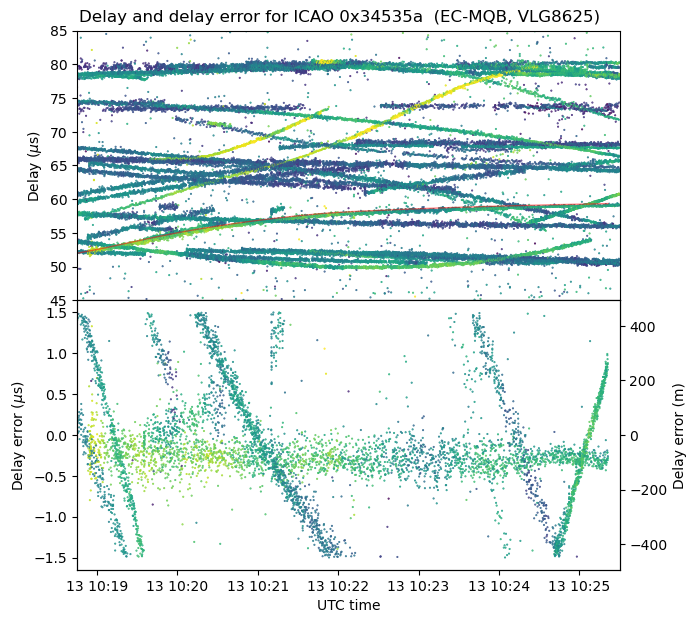

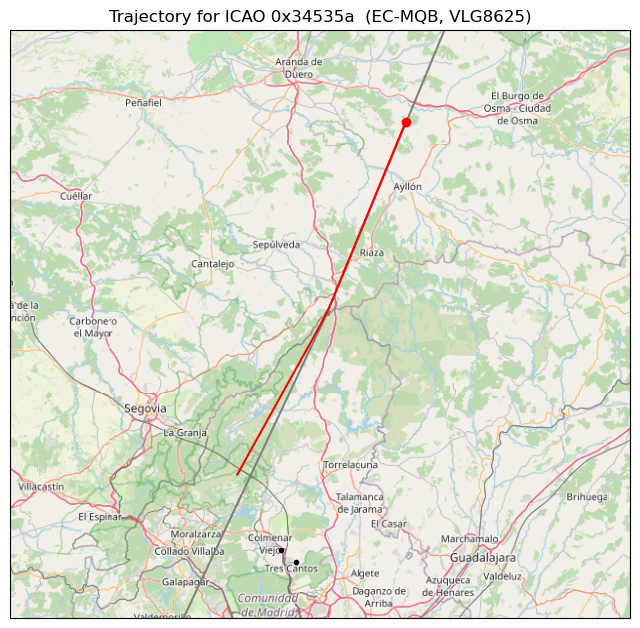

In [32]:
plot_aircraft('34535a', (np.datetime64('2024-07-13T10:18:45'), np.datetime64('2024-07-13T10:25:30')), markersize=1)
plot_map('34535a', (np.datetime64('2024-07-13T10:18:45'), np.datetime64('2024-07-13T10:25:30')), (lat_n858, lon_n858),
         extent=[-4.5, -2.75, 40.5, 41.75], level=9)